<a href="https://colab.research.google.com/github/ahatesham02/Image-Captioning-Bangla--Heliyon-Journal/blob/main/Code/BAN_CAP_image_captioning_with_Attention_%2B_BiGRU_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##New

In [ ]:


import string
import keras
from numpy import array
from pickle import load
from keras.preprocessing.text import Tokenizer
import matplotlib.pyplot as plt
from keras.backend import set_session
import sys, time, os, warnings
warnings.filterwarnings("ignore")
import re

import numpy as np
import pandas as pd
from PIL import Image
import pickle
from collections import Counter
from keras.utils import pad_sequences
from keras.utils import to_categorical
from keras.utils import plot_model
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense, BatchNormalization
from keras.layers import LSTM
from keras.layers import Embedding
from keras.layers import Dropout
from keras.layers import add
from keras.callbacks import ModelCheckpoint
from keras.utils import load_img, img_to_array
from sklearn.utils import shuffle
from keras.applications.vgg16 import VGG16, preprocess_input

from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

In [ ]:
!wget -q https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_Dataset.zip

!unzip -qq Flickr8k_Dataset.zip

In [ ]:
! pip install bnlp_toolkit

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.1/23.1 MB 13.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 80.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 KB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.4/175.4 KB 24.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 70.0 MB/s eta 0:00:00
  Created wheel for emoji: filename=emoji-1.7.0-py3-none-any.whl size=171048 sha256=881d8fd13c3c70fef7b4eebf71659ee4e9f7e0f1452263947415bbc11f2f28e5
  Stored in directory: /root/.cache/pip/wheels/fa/7a/e9/22dd0515e1bad255e51663ee513a2fa839c95934c5fc301090
  Created wheel for gensim: filename=gensim-4.0.1-cp39-cp39-linux_x86_64.whl size=26057763 sha256=9ecdb3a67aa947d17cf8815bea067dd2f2575cc3a2dee17b8be3b260159cd158


In [ ]:
import bnlp
from bnlp.corpus import  punctuations, letters, digits

punkt not found. downloading...


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Image Caption Generation /Bancap/Bancap_preprocessed.csv')


In [ ]:
from os import listdir
## The location of the Flickr8K_ photos
image_dir = '/content/Flicker8k_Dataset'
images = listdir(image_dir)
print(len(images))

8091


In [ ]:
data.head(10)
data.drop(['Unnamed: 0'], axis =1, inplace=True)

In [ ]:
data.head()

,filename,caption
0,1000268201_693b08cb0e.jpg,একটি গোলাপী জামা পরা বাচ্চা মেয়ে একটি বাড়ির প্...
1,1000268201_693b08cb0e.jpg,একটি মেয়ে শিশু একটি কাঠের বাড়িতে ঢুকছে
2,1000268201_693b08cb0e.jpg,একটি বাচ্চা তার কাঠের খেলাঘরে উঠছে
3,1000268201_693b08cb0e.jpg,ছোট মেয়েটি তার খেলার ঘরের সিড়ি বেয়ে উঠছে
4,1000268201_693b08cb0e.jpg,গোলাপি জামা পড়া ছোট একটি মেয়ে একটি কাঠের তৈরি...


In [ ]:
from pickle import load

total_captions = load(open('/content/drive/MyDrive/Image Caption Generation /Bancap/bancap_captions.pkl', 'rb'))
img_name_vector = load(open('/content/drive/MyDrive/Image Caption Generation /Bancap/bancap_img_names.pkl', 'rb'))

In [ ]:
df = pd.DataFrame(list(zip(img_name_vector, total_captions)),
               columns =['filename', 'captions'])
df.head(10)

,filename,captions
0,/content/Flicker8k_Dataset/1000268201_693b08cb...,<start> একটি গোলাপী জামা পরা বাচ্চা মেয়ে একটি ...
1,/content/Flicker8k_Dataset/1000268201_693b08cb...,<start> একটি মেয়ে শিশু একটি কাঠের বাড়িতে ঢুকছে...
2,/content/Flicker8k_Dataset/1000268201_693b08cb...,<start> একটি বাচ্চা তার কাঠের খেলাঘরে উঠছে <...
3,/content/Flicker8k_Dataset/1000268201_693b08cb...,<start> ছোট মেয়েটি তার খেলার ঘরের সিড়ি বেয়ে উঠ...
4,/content/Flicker8k_Dataset/1000268201_693b08cb...,<start> গোলাপি জামা পড়া ছোট একটি মেয়ে একটি কা...
5,/content/Flicker8k_Dataset/1001773457_577c3a7d...,<start> একটি কালো কুকুর এবং একটি ছোপওয়ালা কুকু...
6,/content/Flicker8k_Dataset/1001773457_577c3a7d...,<start> একটি কালো কুকুর একটি তিন রঙা কুকুরের স...
7,/content/Flicker8k_Dataset/1001773457_577c3a7d...,<start> একটি কালো কুকুর ও একটি সাদা বাদামি ছোপ...
8,/content/Flicker8k_Dataset/1001773457_577c3a7d...,<start> ভিন্ন জাতের দুটি কুকুর রাস্তায় একে অপ...
9,/content/Flicker8k_Dataset/1001773457_577c3a7d...,<start> রাস্তার পাশে দুইটি কুকুর পরস্পরের দিকে...


,filename,captions
0,/content/Flicker8k_Dataset/1000268201_693b08cb...,"[একটি, গোলাপী, জামা, পরা, বাচ্চা, মেয়ে, একটি, ..."
1,/content/Flicker8k_Dataset/1000268201_693b08cb...,"[একটি, মেয়ে, শিশু, একটি, কাঠের, বাড়িতে, ঢুকছে]"
2,/content/Flicker8k_Dataset/1000268201_693b08cb...,"[একটি, বাচ্চা, তার, কাঠের, খেলাঘরে, উঠছে]"
3,/content/Flicker8k_Dataset/1000268201_693b08cb...,"[ছোট, মেয়েটি, তার, খেলার, ঘরের, সিড়ি, বেয়ে, উঠছে]"
4,/content/Flicker8k_Dataset/1000268201_693b08cb...,"[গোলাপি, জামা, পড়া, ছোট, একটি, মেয়ে, একটি, কা..."


In [ ]:
filt =['<start>','<unk>','<end>']

In [ ]:
grouped_df = df.groupby('filename')['captions'].apply(list).reset_index(name='captions')
grouped_df['captions'] = [[caption.split() for caption in captions] for captions in grouped_df['captions']]

In [ ]:
grouped_df['captions'][4]

[['<start>',
  'কমলা',
  'টুপি',
  'পরিহিত',
  'একজন',
  'পুরুষ',
  'কোনোকিছুর',
  'দিকে',
  'তাকিয়ে',
  'আছে',
  '<end>'],
 ['<start>',
  'একজন',
  'মানুষ',
  'কমলা',
  'রঙের',
  'টুপি',
  'পরেছ',
  'এবং',
  'চশমাও',
  'পরেছে',
  '<end>'],
 ['<start>',
  'চশমাযুক্ত',
  'একজন',
  'ব্যক্তি',
  'একটি',
  'ব্লিটজ',
  'টুপি',
  'পরেছেন',
  '<end>'],
 ['<start>',
  'চশমা',
  'পরিহিত',
  'একজন',
  'ব্যক্তি',
  'বিয়ারের',
  'কৌটা',
  'দিয়ে',
  'বানানো',
  'টুপি',
  'পরে',
  'আছে',
  '<end>'],
 ['<start>',
  'কান',
  'ফোঁড়ানো',
  'ব্যক্তিটি',
  'চশমা',
  'এবং',
  'কমলা',
  'টুপি',
  'পরেছে',
  '<end>']]

In [ ]:
for i, row in grouped_df.iterrows():
    captions = row['captions']
    captions = [caption[1:-1] for caption in captions]
    grouped_df.at[i, 'captions'] = captions

In [ ]:
grouped_df['captions'][4]

[['কমলা',
  'টুপি',
  'পরিহিত',
  'একজন',
  'পুরুষ',
  'কোনোকিছুর',
  'দিকে',
  'তাকিয়ে',
  'আছে'],
 ['একজন', 'মানুষ', 'কমলা', 'রঙের', 'টুপি', 'পরেছ', 'এবং', 'চশমাও', 'পরেছে'],
 ['চশমাযুক্ত', 'একজন', 'ব্যক্তি', 'একটি', 'ব্লিটজ', 'টুপি', 'পরেছেন'],
 ['চশমা',
  'পরিহিত',
  'একজন',
  'ব্যক্তি',
  'বিয়ারের',
  'কৌটা',
  'দিয়ে',
  'বানানো',
  'টুপি',
  'পরে',
  'আছে'],
 ['কান', 'ফোঁড়ানো', 'ব্যক্তিটি', 'চশমা', 'এবং', 'কমলা', 'টুপি', 'পরেছে']]

In [ ]:
grouped_df.captions[6]

[['ঘাসের', 'উপর', 'একটি', 'বোস্টন', 'টেরিয়ার', 'কুকুর', 'দৌড়াচ্ছে']]

In [ ]:
train_data, test_data, train_caption, test_caption = train_test_split(img_name_vector, total_captions, test_size = 0.1, random_state = 42)

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50,preprocess_input

In [ ]:
image_model = ResNet50(include_top=False,weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output
image_features_extract_model = tf.compat.v1.keras.Model(new_input, hidden_layer)

94765736/94765736 [==============================] - 6s 0us/step


In [ ]:
image_features_extract_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, None, None,   0           ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, None, None,   9472        ['conv1_pad[0][0]']              
                                64)                                                           

In [ ]:
preprocessed_image = []
IMAGE_SHAPE = (224, 224)

In [ ]:
for img in train_data[0:5] :
    img = tf.io.read_file(img, name=None)
    img = tf.image.decode_jpeg(img, channels=0)
    img = tf.image.resize(img, (224, 224))
    img = tf.keras.applications.resnet50.preprocess_input(img)
    preprocessed_image.append(img)

Shape after resize :  (224, 224, 3)
Shape after resize :  (224, 224, 3)
Shape after resize :  (224, 224, 3)
Shape after resize :  (224, 224, 3)
Shape after resize :  (224, 224, 3)


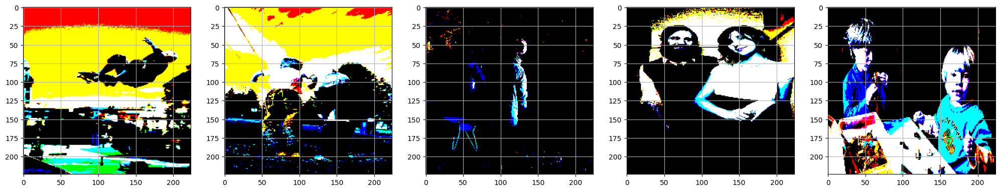

In [ ]:
# checking first five images post preprocessing
Display_Images = preprocessed_image[0:5]
figure, axes = plt.subplots(1,5)
figure.set_figwidth(25)
for ax, image in zip(axes, Display_Images) :
  print('Shape after resize : ', image.shape)
  ax.imshow(image)
  ax.grid('off')

Shape after resize : (224, 224, 3)


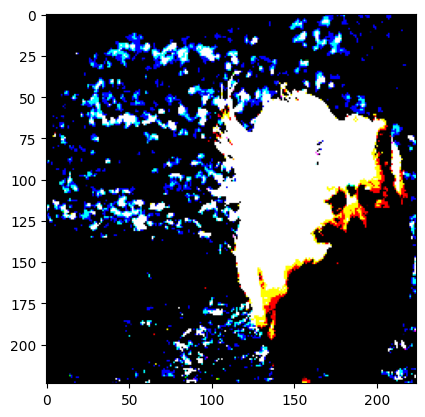

In [ ]:
def load_images(image_path) :
  img = tf.io.read_file(image_path, name = None)
  img = tf.image.decode_jpeg(img, channels=0)
  img = tf.image.resize(img, IMAGE_SHAPE)
  img = preprocess_input(img)
  return img, image_path

img1,img1_path = load_images("Flicker8k_Dataset/3439243433_d5f3508612.jpg")
print("Shape after resize :", img1.shape)
plt.imshow(img1)

## Tokenizer and Vocabulary

In [ ]:
tokenizer = tf.keras.preprocessing.text.Tokenizer(
                                                 oov_token="<unk>",
                                                 filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')

tokenizer.fit_on_texts(train_caption)
train_seqs = tokenizer.texts_to_sequences(train_caption)
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

train_seqs = tokenizer.texts_to_sequences(train_caption)
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

In [ ]:
vocab_size = len(tokenizer.index_word)+1

In [ ]:
vocab_size

14674

In [ ]:
train_caption[:3]

['<start> একজন লোক স্কেটবোর্ডে চড়ে শূন্যে লাফ দিয়ে ভেসে আছে <end>',
 '<start> দুজন শিশু বালক একটি সুন্দর দিনে পাডলের উপর খেলছে <end>',
 '<start> হুইলবারোর কাছে দাঁড়িয়ে থাকা দুটি শিশু তাদের সামনে হ্রদের দিকে তাকিয়ে আছে  <end>']

In [ ]:
train_seqs[:3]

[[2, 5, 9, 257, 182, 116, 38, 25, 656, 7, 3],
 [2, 69, 43, 68, 4, 667, 434, 7252, 13, 16, 3],
 [2, 7253, 121, 46, 84, 18, 43, 112, 39, 473, 37, 156, 7, 3]]

In [ ]:
tokenizer.index_word

{1: '<unk>',
 2: '<start>',
 3: '<end>',
 4: 'একটি',
 5: 'একজন',
 6: 'কুকুর',
 7: 'আছে',
 8: 'এক',
 9: 'লোক',
 10: 'করছে',
 11: 'এবং',
 12: 'কালো',
 13: 'উপর',
 14: 'সাদা',
 15: 'মহিলা',
 16: 'খেলছে',
 17: 'বসে',
 18: 'দুটি',
 19: 'তার',
 20: 'রঙের',
 21: 'লাল',
 22: 'ছেলে',
 23: 'পরা',
 24: 'ছোট',
 25: 'দিয়ে',
 26: 'পরিহিত',
 27: 'ও',
 28: 'নীল',
 29: 'মধ্যে',
 30: 'বাচ্চা',
 31: 'দাঁড়িয়ে',
 32: 'নিয়ে',
 33: 'ব্যক্তি',
 34: 'পাশে',
 35: 'করে',
 36: 'দিচ্ছে',
 37: 'দিকে',
 38: 'লাফ',
 39: 'সামনে',
 40: 'দৌড়াচ্ছে',
 41: 'মেয়ে',
 42: 'ধরে',
 43: 'শিশু',
 44: 'যাচ্ছে',
 45: 'দিয়ে',
 46: 'দাঁড়িয়ে',
 47: 'থেকে',
 48: 'জামা',
 49: 'ঘাসের',
 50: 'পরে',
 51: 'বল',
 52: 'কুকুরটি',
 53: 'সাথে',
 54: 'নিয়ে',
 55: 'বাদামী',
 56: 'পানিতে',
 57: 'মেয়ে',
 58: 'কিছু',
 59: 'জন্য',
 60: 'সবুজ',
 61: 'একদল',
 62: 'হলুদ',
 63: 'মাঠে',
 64: 'পোশাক',
 65: 'দুই',
 66: 'মুখে',
 67: 'আছেন',
 68: 'বালক',
 69: 'দুজন',
 70: 'মানুষ',
 71: 'লোকটি',
 72: 'হাতে',
 73: 'দেখছে',
 74: 'সাইকেল',
 75: 'নারী',
 76: '

In [ ]:
# Pad each vector to the max_length of the captions  store it to a vairable

train_seqs_len = [len(seq) for seq in train_seqs]

longest_word_length = max(train_seqs_len)

cap_vector= tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding= 'post', maxlen = longest_word_length,
                                                          dtype='int32', value=0)
print("The shape of Caption vector is :" + str(cap_vector.shape))

The shape of Caption vector is :(36000, 34)


In [ ]:
cap_vector

array([[    2,     5,     9, ...,     0,     0,     0],
       [    2,    69,    43, ...,     0,     0,     0],
       [    2,  7253,   121, ...,     0,     0,     0],
       ...,
       [    2,   187,   257, ...,     0,     0,     0],
       [    2, 14672,  1770, ...,     0,     0,     0],
       [    2,   216,    74, ...,     0,     0,     0]], dtype=int32)

## Creating Dataset

In [ ]:
# Map each image full path to the function, in order to preprocess the image
training_list = sorted(set(train_data))
New_Img = tf.data.Dataset.from_tensor_slices(training_list)
New_Img = New_Img.map(load_images, num_parallel_calls = tf.data.experimental.AUTOTUNE)
New_Img = New_Img.batch(64, drop_remainder=False)

In [ ]:
path_train, path_test, caption_train, caption_test = train_test_split(train_data, cap_vector, test_size = 0.1, random_state = 42)

In [ ]:
print("Training data for images: " + str(len(path_train)))
print("Testing data for images: " + str(len(path_test)))
print("Training data for Captions: " + str(len(caption_train)))
print("Testing data for Captions: " + str(len(caption_test)))

Training data for images: 32400
Testing data for images: 3600
Training data for Captions: 32400
Testing data for Captions: 3600


In [ ]:
from tqdm import tqdm

In [ ]:
New_Img

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.string, name=None))>

In [ ]:
# extract features from each image in the dataset
img_features = {}
for image, image_path in tqdm(New_Img) :
  batch_features = image_features_extract_model(image)
  #squeeze out the features in a batch
  batch_features_flattened = tf.reshape(batch_features, (batch_features.shape[0], -1, batch_features.shape[3]))
  for batch_feat, path in zip(batch_features_flattened, image_path) :
    feature_path = path.numpy().decode('utf-8')
    img_features[feature_path] = batch_feat.numpy()

100%|██████████| 125/125 [00:38<00:00,  3.26it/s]


In [ ]:
batch_features

<tf.Tensor: shape=(64, 7, 7, 2048), dtype=float32, numpy=
array([[[[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 4.7711940e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 1.1169077e+00],
         ...,
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],

        [[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 1.2774032e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 5.0966322e-01]

In [ ]:
batch_features_flattened

<tf.Tensor: shape=(64, 49, 2048), dtype=float32, numpy=
array([[[ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  4.771194  ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  1.1169077 ],
        ...,
        [ 0.        ,  0.        ,  0.        , ...,  7.961609  ,
          0.        ,  0.        ],
        [ 0.21795821,  0.        ,  0.        , ...,  1.0829487 ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  1.4408458 ,
          0.        ,  1.5932412 ]],

       [[ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        ...

In [ ]:
batch_feat.shape

TensorShape([49, 2048])

In [ ]:
img_features

{'/content/Flicker8k_Dataset/1000268201_693b08cb0e.jpg': array([[0.       , 0.       , 0.       , ..., 3.2088284, 0.       ,
         0.       ],
        [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
         0.       ],
        [0.       , 2.5231423, 0.       , ..., 0.       , 0.       ,
         0.       ],
        ...,
        [0.       , 0.       , 0.       , ..., 0.       , 6.8373046,
         0.       ],
        [0.       , 0.       , 0.       , ..., 0.       , 3.8534644,
         0.       ],
        [0.       , 0.       , 0.       , ..., 0.       , 4.3590107,
         0.       ]], dtype=float32),
 '/content/Flicker8k_Dataset/1001773457_577c3a7d70.jpg': array([[0.        , 0.        , 0.        , ..., 0.61871135, 0.        ,
         0.        ],
        [1.4099102 , 0.        , 0.        , ..., 0.        , 5.1975617 ,
         0.        ],
        [4.414052  , 0.        , 0.5123825 , ..., 0.        , 4.637478  ,
         0.        ],
        ...,
        [0.062016

In [ ]:
#to provide, both images along with the captions as input
def map(image_name, caption):
    img_tensor = img_features[image_name.decode('utf-8')]
    return img_tensor, caption

In [ ]:
# This function should transform the created dataset(img_path,cap) to (features,cap) using the map_func created earlier
BUFFER_SIZE = 1000
BATCH_SIZE = 64
def gen_dataset(img, capt):

    data = tf.data.Dataset.from_tensor_slices((img, capt))
    data = data.map(lambda ele1, ele2 : tf.numpy_function(map, [ele1, ele2], [tf.float32, tf.int32]),
                    num_parallel_calls = tf.data.experimental.AUTOTUNE)


    data = (data.shuffle(BUFFER_SIZE, reshuffle_each_iteration= True).batch(BATCH_SIZE, drop_remainder = False)
    .prefetch(tf.data.experimental.AUTOTUNE))
    return data

In [ ]:
train_dataset = gen_dataset(path_train,caption_train)
test_dataset = gen_dataset(path_test,caption_test)

In [ ]:
sample_img_batch, sample_cap_batch = next(iter(train_dataset))
print(sample_img_batch.shape)  #(batch_size, 8*8, 2048)
print(sample_cap_batch.shape) #(batch_size,max_len)

(64, 49, 2048)
(64, 34)


In [ ]:
embedding_dim = 256
units = 512
vocab_size = vocab_size
train_num_steps = len(path_train) // BATCH_SIZE
test_num_steps = len(path_test) // BATCH_SIZE
EPOCHS = 20
max_length = 108
feature_shape = batch_feat.shape[1]
attention_feature_shape = batch_feat.shape[0]

In [ ]:
vocab_size

14674

In [ ]:
feature_shape

2048

In [ ]:
attention_feature_shape

49

## CNN Encoder

In [ ]:
from keras.utils.vis_utils import plot_model

In [ ]:
tf.compat.v1.reset_default_graph()
print(tf.compat.v1.get_default_graph())

In [ ]:
#Building Encoder using CNN Keras subclassing method

class Encoder(Model):
    def __init__(self,embed_dim):
        super(Encoder, self).__init__()
        self.dense = tf.keras.layers.Dense(embed_dim) #build your Dense layer with relu activation

    def call(self, features):
        features =  self.dense(features) # extract the features from the image shape: (batch, 8*8, embed_dim)
        features =  tf.keras.activations.relu(features, alpha=0.01, max_value=None, threshold=0)
        return features

In [ ]:
encoder=Encoder(embedding_dim)

## Attention Model

In [ ]:
class Bahdanau_Attention(Model):
    def __init__(self, units):
        super(Bahdanau_Attention, self).__init__()
        self.units=units
        self.W1 = tf.keras.layers.Dense(units)
        self.W2 = tf.keras.layers.Dense(units)
        self.V = tf.keras.layers.Dense(1)


    def call(self, features, hidden):
        hidden_with_time_axis = hidden[:, tf.newaxis]
        score = tf.keras.activations.tanh(self.W1(features) + self.W2(hidden_with_time_axis))
        attention_weights = tf.keras.activations.softmax(self.V(score), axis=1)
        context_vector = attention_weights * features
        context_vector = tf.reduce_sum(context_vector, axis=1)
        return context_vector, attention_weights

In [ ]:
class Decoder(Model):
    def __init__(self, embed_dim, units, vocab_size):
        super(Decoder, self).__init__()
        self.units=units
        self.attention = Bahdanau_Attention(self.units) #iniitalise your Attention model with units
        self.embed = tf.keras.layers.Embedding(vocab_size, embed_dim) #build your Embedding layer
        self.gru = tf.keras.layers.Bidirectional(tf.keras.layers.GRU(self.units,return_sequences=True,return_state=True,recurrent_initializer='glorot_uniform'))
        self.d1 = tf.keras.layers.Dense(self.units) #build your Dense layer
        self.d2 = tf.keras.layers.Dense(vocab_size) #build your Dense layer


    def call(self,x,features, hidden):
        context_vector, attention_weights = self.attention(features, hidden) #create your context vector & attention weights from attention model
        embed = self.embed(x) # embed your input to shape: (batch_size, 1, embedding_dim)
        embed = tf.concat([tf.expand_dims(context_vector, 1), embed], axis = -1) # Concatenate your input with the context vector from attention layer. Shape: (batch_size, 1, embedding_dim + embedding_dim)
        output,state,_ = self.gru(embed) # Extract the output & hidden state from GRU layer. Output shape : (batch_size, max_length, hidden_size)
        output = self.d1(output)
        output = tf.reshape(output, (-1, output.shape[2])) # shape : (batch_size * max_length, hidden_size)
        output = self.d2(output) # shape : (batch_size * max_length, vocab_size)
        return output, state, attention_weights

    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [ ]:
class Decoder2(Model):
    def __init__(self, embed_dim, units, vocab_size):
        super(Decoder2, self).__init__()
        self.units=units
        self.attention = Bahdanau_Attention(self.units) #iniitalise your Attention model with units
        self.embed = tf.keras.layers.Embedding(vocab_size, embed_dim) #build your Embedding layer
        self.gru = tf.keras.layers.Bidirectional(tf.keras.layers.GRU(self.units,return_sequences=True,return_state=True,recurrent_initializer='glorot_uniform'))
        self.d1 = tf.keras.layers.Dense(self.units) #build your Dense layer
        self.d2 = tf.keras.layers.Dense(vocab_size) #build your Dense layer


    def call(self,x,features, hidden):
        context_vector, attention_weights = self.attention(features, hidden) #create your context vector & attention weights from attention model
        embed = self.embed(x) # embed your input to shape: (batch_size, 1, embedding_dim)
        embed = tf.concat([tf.expand_dims(context_vector, 1), embed], axis = -1) # Concatenate your input with the context vector from attention layer. Shape: (batch_size, 1, embedding_dim + embedding_dim)
        output,state_f,state_b = self.gru(embed) # Extract the output & hidden state from GRU layer. Output shape : (batch_size, max_length, hidden_size)
        #print(output.shape)
        #print(state_f.shape)
        #print(state_b.shape)
        state = tf.keras.layers.Add()([state_f, state_b])
        #print(state.shape)
        output = self.d1(output)
        output = tf.reshape(output, (-1, output.shape[2])) # shape : (batch_size * max_length, hidden_size)
        output = self.d2(output) # shape : (batch_size * max_length, vocab_size)
        return output, state, attention_weights

    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [ ]:
decoder=Decoder2(embedding_dim, units, vocab_size)

In [ ]:
features=encoder(sample_img_batch)

hidden = decoder.init_state(batch_size=sample_cap_batch.shape[0])
dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * sample_cap_batch.shape[0], 1)

predictions, hidden_out, attention_weights= decoder(dec_input, features, hidden)
print('Feature shape from Encoder: {}'.format(features.shape)) #(batch, 8*8, embed_dim)
print('Predcitions shape from Decoder: {}'.format(predictions.shape)) #(batch,vocab_size)
print('Attention weights shape from Decoder: {}'.format(attention_weights.shape)) #(batch, 8*8, embed_dim

Feature shape from Encoder: (64, 49, 256)
Predcitions shape from Decoder: (64, 14674)
Attention weights shape from Decoder: (64, 49, 1)


In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001)  #define the optimizer
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True, reduction = tf.keras.losses.Reduction.NONE)

In [ ]:
def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)

    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask
    #loss is getting multiplied with mask to get an ideal shape

    return tf.reduce_mean(loss_)

In [ ]:
checkpoint_path = "/content/drive/MyDrive/Image Caption Generation /Bancap/Models"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [ ]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

In [ ]:
@tf.function
def train_step(img_tensor, target):
    loss = 0
    hidden = decoder.init_state(batch_size=target.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

    with tf.GradientTape() as tape:

        encoder_op = encoder(img_tensor)
        for r in range(1, target.shape[1]) :
          predictions, hidden, _ = decoder(dec_input, encoder_op, hidden)
          loss = loss + loss_function(target[:, r], predictions)
          dec_input = tf.expand_dims(target[:, r], 1)

    avg_loss = (loss/ int(target.shape[1])) #avg loss per batch
    trainable_vars = encoder.trainable_variables + decoder.trainable_variables
    grad = tape.gradient (loss, trainable_vars)
    optimizer.apply_gradients(zip(grad, trainable_vars))

    return loss, avg_loss

In [ ]:
@tf.function
def test_step(img_tensor, target):
    loss = 0
    hidden = decoder.init_state(batch_size = target.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    with tf.GradientTape() as tape:
      encoder_op = encoder(img_tensor)
      for r in range(1, target.shape[1]) :
        predictions, hidden, _ = decoder(dec_input, encoder_op, hidden)
        loss = loss + loss_function(target[:, r], predictions)
        dec_input = tf.expand_dims(target[: , r], 1)
    avg_loss = (loss/ int(target.shape[1])) #avg loss per batch
    trainable_vars = encoder.trainable_variables + decoder.trainable_variables
    grad = tape.gradient (loss, trainable_vars)
    optimizer.apply_gradients(zip(grad, trainable_vars))
    return loss, avg_loss

In [ ]:
def test_loss_cal(test_dataset):
    total_loss = 0
    for (batch, (img_tensor, target)) in enumerate(test_dataset) :
      batch_loss, t_loss = test_step(img_tensor, target)
      total_loss = total_loss + t_loss
      avg_test_loss = total_loss/ test_num_steps

    return avg_test_loss

In [ ]:
loss_plot = []
test_loss_plot = []
EPOCHS = 30
best_test_loss=100
for epoch in tqdm(range(0, EPOCHS)):
    start = time.time()
    total_loss = 0
    for (batch, (img_tensor, target)) in enumerate(train_dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss
        avg_train_loss=total_loss / train_num_steps
    loss_plot.append(avg_train_loss)
    test_loss = test_loss_cal(test_dataset)
    test_loss_plot.append(test_loss)
    print ('For epoch: {}, the train loss is {:.3f}, & test loss is {:.3f}'.format(epoch+1,avg_train_loss,test_loss))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))
    if test_loss < best_test_loss:
        print('Test loss has been reduced from %.3f to %.3f' % (best_test_loss, test_loss))
        best_test_loss = test_loss
        ckpt_manager.save()

  0%|          | 0/30 [00:00<?, ?it/s]

For epoch: 1, the train loss is 1.463, & test loss is 1.260
Time taken for 1 epoch 297.83996057510376 sec

Test loss has been reduced from 100.000 to 1.260


  3%|▎         | 1/30 [04:59<2:24:32, 299.04s/it]

For epoch: 2, the train loss is 1.133, & test loss is 1.074
Time taken for 1 epoch 88.67547273635864 sec

Test loss has been reduced from 1.260 to 1.074


  7%|▋         | 2/30 [06:28<1:21:57, 175.64s/it]

For epoch: 3, the train loss is 1.002, & test loss is 0.957
Time taken for 1 epoch 86.36863923072815 sec

Test loss has been reduced from 1.074 to 0.957


 10%|█         | 3/30 [07:55<1:00:53, 135.32s/it]

For epoch: 4, the train loss is 0.901, & test loss is 0.861
Time taken for 1 epoch 86.4984278678894 sec

Test loss has been reduced from 0.957 to 0.861


 13%|█▎        | 4/30 [09:22<50:23, 116.29s/it]  

For epoch: 5, the train loss is 0.813, & test loss is 0.778
Time taken for 1 epoch 85.9385941028595 sec

Test loss has been reduced from 0.861 to 0.778


 17%|█▋        | 5/30 [10:49<44:02, 105.70s/it]

For epoch: 6, the train loss is 0.739, & test loss is 0.708
Time taken for 1 epoch 85.76856231689453 sec

Test loss has been reduced from 0.778 to 0.708


 20%|██        | 6/30 [12:16<39:38, 99.11s/it] 

For epoch: 7, the train loss is 0.672, & test loss is 0.645
Time taken for 1 epoch 85.79638409614563 sec

Test loss has been reduced from 0.708 to 0.645


 23%|██▎       | 7/30 [13:42<36:26, 95.07s/it]

For epoch: 8, the train loss is 0.613, & test loss is 0.587
Time taken for 1 epoch 85.5939724445343 sec

Test loss has been reduced from 0.645 to 0.587


 27%|██▋       | 8/30 [15:08<33:49, 92.25s/it]

For epoch: 9, the train loss is 0.559, & test loss is 0.536
Time taken for 1 epoch 85.55398607254028 sec

Test loss has been reduced from 0.587 to 0.536


 30%|███       | 9/30 [16:35<31:39, 90.47s/it]

For epoch: 10, the train loss is 0.506, & test loss is 0.485
Time taken for 1 epoch 85.80065321922302 sec

Test loss has been reduced from 0.536 to 0.485


 33%|███▎      | 10/30 [18:01<29:44, 89.21s/it]

For epoch: 11, the train loss is 0.461, & test loss is 0.440
Time taken for 1 epoch 85.29966616630554 sec

Test loss has been reduced from 0.485 to 0.440


 37%|███▋      | 11/30 [19:28<27:58, 88.32s/it]

For epoch: 12, the train loss is 0.422, & test loss is 0.418
Time taken for 1 epoch 85.39566946029663 sec

Test loss has been reduced from 0.440 to 0.418


 40%|████      | 12/30 [20:54<26:17, 87.61s/it]

For epoch: 13, the train loss is 0.392, & test loss is 0.370
Time taken for 1 epoch 85.55283117294312 sec

Test loss has been reduced from 0.418 to 0.370


 43%|████▎     | 13/30 [22:20<24:43, 87.28s/it]

For epoch: 14, the train loss is 0.345, & test loss is 0.324
Time taken for 1 epoch 85.30546975135803 sec

Test loss has been reduced from 0.370 to 0.324


 47%|████▋     | 14/30 [23:46<23:09, 86.86s/it]

For epoch: 15, the train loss is 0.314, & test loss is 0.302
Time taken for 1 epoch 85.4679172039032 sec

Test loss has been reduced from 0.324 to 0.302


 50%|█████     | 15/30 [25:13<21:41, 86.74s/it]

For epoch: 16, the train loss is 0.290, & test loss is 0.280
Time taken for 1 epoch 85.44823956489563 sec

Test loss has been reduced from 0.302 to 0.280


 53%|█████▎    | 16/30 [26:39<20:11, 86.54s/it]

For epoch: 17, the train loss is 0.268, & test loss is 0.254
Time taken for 1 epoch 85.1285309791565 sec

Test loss has been reduced from 0.280 to 0.254


 60%|██████    | 18/30 [29:30<17:14, 86.17s/it]

For epoch: 18, the train loss is 0.268, & test loss is 0.261
Time taken for 1 epoch 85.59923362731934 sec

For epoch: 19, the train loss is 0.245, & test loss is 0.219
Time taken for 1 epoch 85.68752861022949 sec

Test loss has been reduced from 0.254 to 0.219


 63%|██████▎   | 19/30 [30:57<15:48, 86.19s/it]

For epoch: 20, the train loss is 0.221, & test loss is 0.204
Time taken for 1 epoch 85.27730965614319 sec

Test loss has been reduced from 0.219 to 0.204


 67%|██████▋   | 20/30 [32:23<14:22, 86.21s/it]

For epoch: 21, the train loss is 0.202, & test loss is 0.198
Time taken for 1 epoch 85.5796685218811 sec

Test loss has been reduced from 0.204 to 0.198


 70%|███████   | 21/30 [33:49<12:55, 86.19s/it]

For epoch: 22, the train loss is 0.197, & test loss is 0.194
Time taken for 1 epoch 85.40396690368652 sec

Test loss has been reduced from 0.198 to 0.194


 73%|███████▎  | 22/30 [35:15<11:30, 86.26s/it]

For epoch: 23, the train loss is 0.196, & test loss is 0.187
Time taken for 1 epoch 85.08080697059631 sec

Test loss has been reduced from 0.194 to 0.187


 77%|███████▋  | 23/30 [36:41<10:02, 86.10s/it]

For epoch: 24, the train loss is 0.179, & test loss is 0.169
Time taken for 1 epoch 85.17070841789246 sec

Test loss has been reduced from 0.187 to 0.169


 80%|████████  | 24/30 [38:07<08:36, 86.11s/it]

For epoch: 25, the train loss is 0.171, & test loss is 0.167
Time taken for 1 epoch 85.37506198883057 sec

Test loss has been reduced from 0.169 to 0.167


 83%|████████▎ | 25/30 [39:34<07:10, 86.17s/it]

For epoch: 26, the train loss is 0.170, & test loss is 0.161
Time taken for 1 epoch 85.53314638137817 sec

Test loss has been reduced from 0.167 to 0.161


 87%|████████▋ | 26/30 [41:00<05:44, 86.15s/it]

For epoch: 27, the train loss is 0.161, & test loss is 0.155
Time taken for 1 epoch 85.30853843688965 sec

Test loss has been reduced from 0.161 to 0.155


 90%|█████████ | 27/30 [42:26<04:18, 86.15s/it]

For epoch: 28, the train loss is 0.156, & test loss is 0.148
Time taken for 1 epoch 85.53434205055237 sec

Test loss has been reduced from 0.155 to 0.148


 97%|█████████▋| 29/30 [45:18<01:26, 86.07s/it]

For epoch: 29, the train loss is 0.154, & test loss is 0.155
Time taken for 1 epoch 85.62467575073242 sec



100%|██████████| 30/30 [46:43<00:00, 93.46s/it]

For epoch: 30, the train loss is 0.149, & test loss is 0.148
Time taken for 1 epoch 85.33809757232666 sec



In [ ]:
ckpt_manager.checkpoints

['/content/drive/MyDrive/Image Caption Generation /Bancap/Models/ckpt-23',
 '/content/drive/MyDrive/Image Caption Generation /Bancap/Models/ckpt-24',
 '/content/drive/MyDrive/Image Caption Generation /Bancap/Models/ckpt-25',
 '/content/drive/MyDrive/Image Caption Generation /Bancap/Models/ckpt-26',
 '/content/drive/MyDrive/Image Caption Generation /Bancap/Models/ckpt-27']

In [ ]:
ckpt.restore('/content/drive/MyDrive/Image Caption Generation /Bancap/Models/ckpt-27')

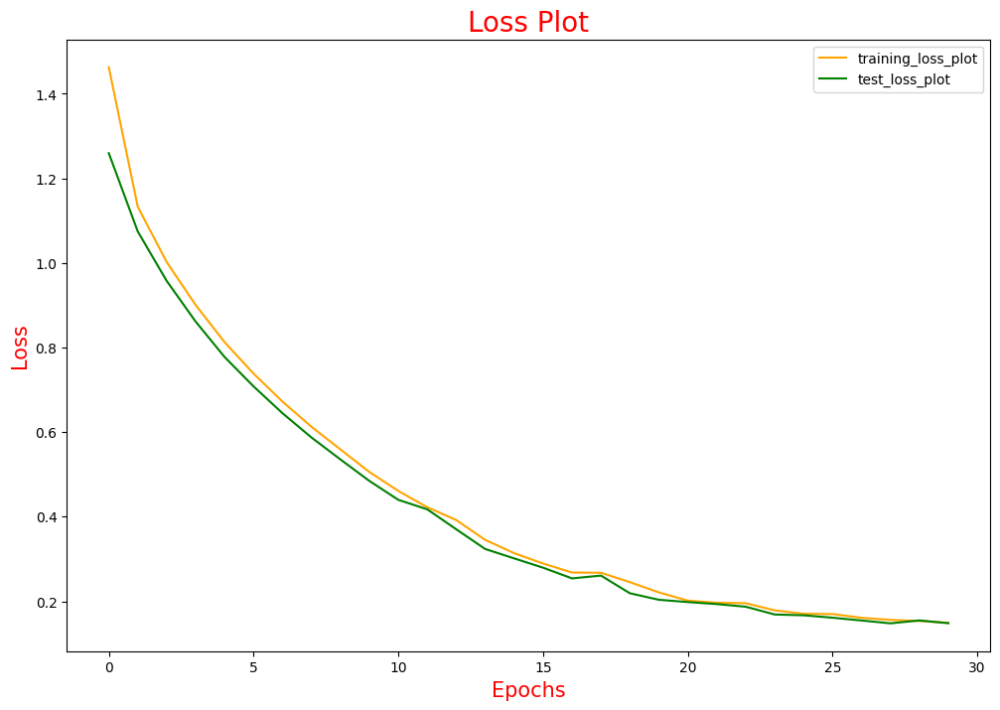

In [ ]:
from matplotlib.pyplot import figure
figure(figsize=(12, 8))
plt.plot(loss_plot, color='orange', label = 'training_loss_plot')
plt.plot(test_loss_plot, color='green', label = 'test_loss_plot')
plt.xlabel('Epochs', fontsize = 15, color = 'red')
plt.ylabel('Loss', fontsize = 15, color = 'red')
plt.title('Loss Plot', fontsize = 20, color = 'red')
plt.legend()
plt.show()

In [ ]:
attention_feature_shape

49

In [ ]:
attention_plot = np.zeros((max_length, attention_feature_shape))
attention_plot

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
import matplotlib.font_manager as fm
import matplotlib.pyplot as plt
font_path = '/content/drive/MyDrive/Image Caption Generation /SolaimanLipi_20-04-07.ttf'
prop = fm.FontProperties(fname=font_path)

In [ ]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_feature_shape))

    hidden = decoder.init_state(batch_size=1)

    temp_input = tf.expand_dims(load_images(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder (img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.argmax(predictions[0]).numpy()
        result.append (tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot,predictions

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot,predictions

In [ ]:
def plot_attention_map(caption, weights, image) :

  fig = plt.figure(figsize = (12, 12))
  temp_img = np.array(Image.open(image))

  cap_len = len(caption)
  for cap in range(len(caption)) :
    weights_img = np.reshape(weights[cap], (7,7))
    wweights_img = np.array(Image.fromarray(weights_img).resize((224,224), Image.LANCZOS))

    ax = fig.add_subplot(cap_len//2, cap_len//2, cap+1)
    ax.set_title(caption[cap], fontsize = 38, color = 'red',fontproperties=prop)

    img = ax.imshow(temp_img)

    ax.imshow(weights_img, cmap='gray', alpha=0.6, extent=img.get_extent())
    ax.axis('off')
  plt.subplots_adjust(hspace=0.2, wspace=0.2)
  plt.show()

In [ ]:
def filt_text(text):
    filt=['<start>','<unk>','<end>']
    temp= text.split()
    [temp.remove(j) for k in filt for j in temp if k==j]
    text=' '.join(temp)
    return text

In [ ]:
image_test = path_test.copy()

In [ ]:
from nltk.translate.bleu_score import sentence_bleu, corpus_bleu, SmoothingFunction

In [ ]:
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [ ]:
from nltk.translate.meteor_score import meteor_score

In [ ]:
encoder.save_weights('content/outputs_encoder')
decoder.save_weights('.content/outputs_decoder')

In [ ]:
path_test

BLEU-1: 47.768754
BLEU-2: 37.001518
BLEU-3: 27.735925
BLEU-4: 17.999149
Meteor Score: 0.480769
Real Caption: দুই বাচ্চা তাদের কুকুর নিয়ে বরফের মধ্যে খেলছে
Prediction Caption: দুটি বাচ্চা তাদের কুকুর বরফে খেলছে


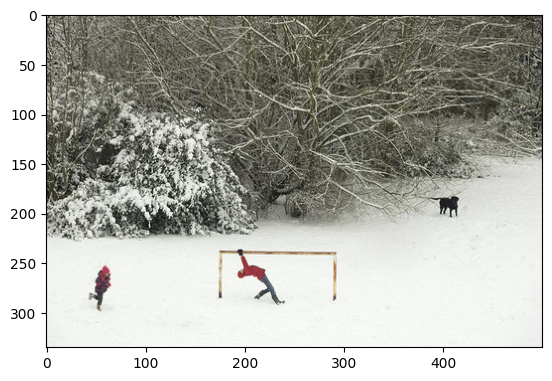

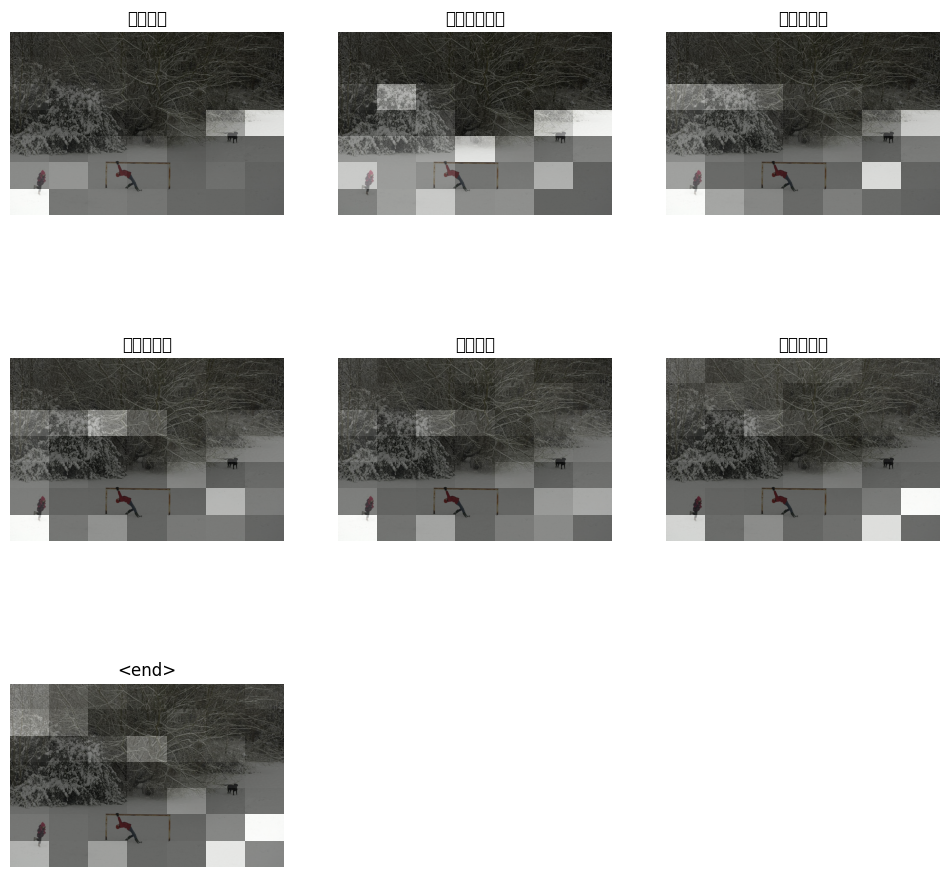

In [ ]:
cap_test_data = caption_test.copy()
rid = 101

test_image= path_test[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_test_data[rid] if i not in [0]])
result, attention_plot, pred_test = evaluate(test_image)
real_caption=filt_text(real_caption)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)
score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)

print ('Real Caption:', real_caption)
print ('Prediction Caption:', pred_caption)

plot_attention_map(result, attention_plot, test_image)


In [ ]:
len(test_data)

4000

## Evaluation

Real Caption: ['একদল মহিলা ও শিশুর দল ফটোগ্রাফারের দিকে চেয়ে আছে', 'অনেক আফ্রিকান মহিলা ও শিশু একসাথে', 'রঙিন পোশাক পরিহিত একদল মানুষ বাজারে বসে আছে', 'বিভিন্ন ধরণের পোশাক পরা অসংখ্য আফ্রিকান আমেরিকান', 'আফ্রিকান গ্রামের লোকজন মাটিতে বসা']
Prediction Caption: আফ্রিকান মহিলা আফ্রিকান ব্যক্তি রং করে নিয়ে দাঁড়িয়ে আছে
BLEU-1: 33.333333
BLEU-2: 20.412415
BLEU-3: 9.735036
BLEU-4: 6.995433
Meteor Score: 0.158730


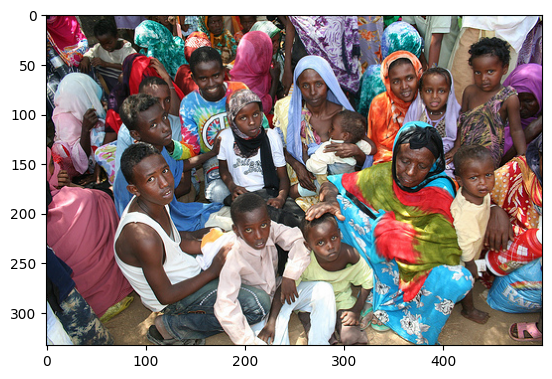

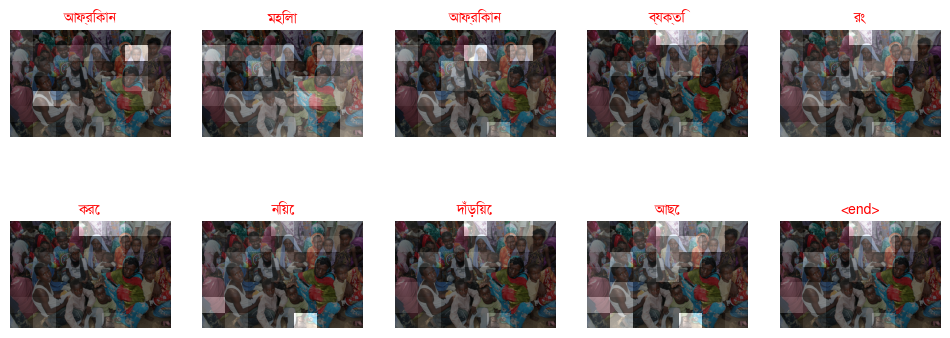

In [ ]:
cap_test_data = test_caption.copy()
rid = np.random.randint(0, len(test_data))
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['এক ব্যাক্তি ভেজা স্যুট গায়ে সমুদ্রে সার্ফিং করছে', 'হলুদ ও কালো রঙের গোসলের পোশাক পরিহিত একজন সার্ফার ঢেউয়ের সাথে ধাক্কা খেয়ে পড়ে যাচ্ছে', 'তার সাদা সার্ফবোর্ডে একটি সার্ফার ঢেউ ধরছে', 'হলুদ শার্ট পরা একজন তরুণ পুরুষ সার্ফার তার সাদা বোর্ডে সমুদ্রের ঢেউয়ের উপরে চড়লেন', 'হলুদ শার্টে থাকা এক যুবক তার সার্ফবোর্ডটি নিয়ে ঢেউয়ে উড়ে গেলো']
Prediction Caption: হলুদ পোষাক পরা একজন সার্ফার ঢেউয়ের মধ্যে ছুড়ে এগিয়ে যাচ্ছেন
BLEU-1: 45.241871
BLEU-2: 36.939833
BLEU-3: 23.207980
BLEU-4: 14.639952
Meteor Score: 0.258621


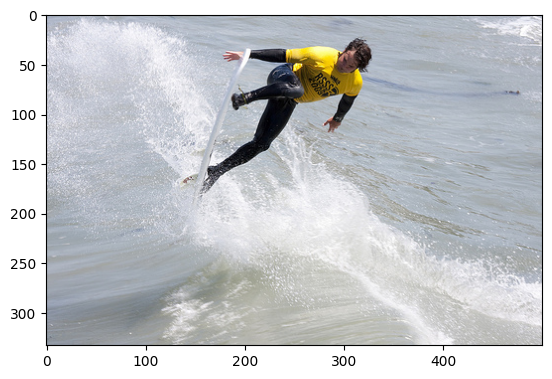

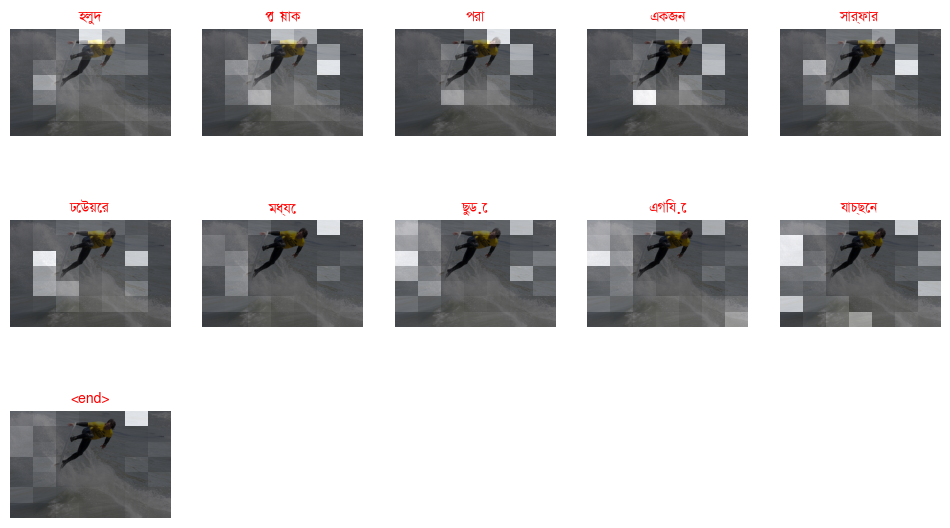

In [ ]:
cap_test_data = test_caption.copy()
rid = np.random.randint(0, len(test_data))
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['দুটি বাদামী কুকুর একটি ফুটবল নিয়ে খেলছে', 'দুটি কুকুর লাল এবং সাদা বল নিয়ে খেলছে', 'লাল স্ট্রিপের বলের পেছনে ছুটছে দুটি ছোট কুকুর', 'দুটি কুকুর বল দিয়ে খেলছে', 'দুটি ছোট কুকুর ভলিবল খেলছে']
Prediction Caption: দুটি বাদামী কুকুর একটি ফুটবল নিয়ে খেলছে
BLEU-1: 100.000000
BLEU-2: 100.000000
BLEU-3: 100.000000
BLEU-4: 100.000000
Meteor Score: 0.998542


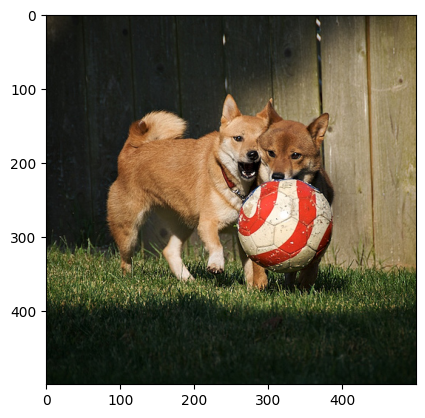

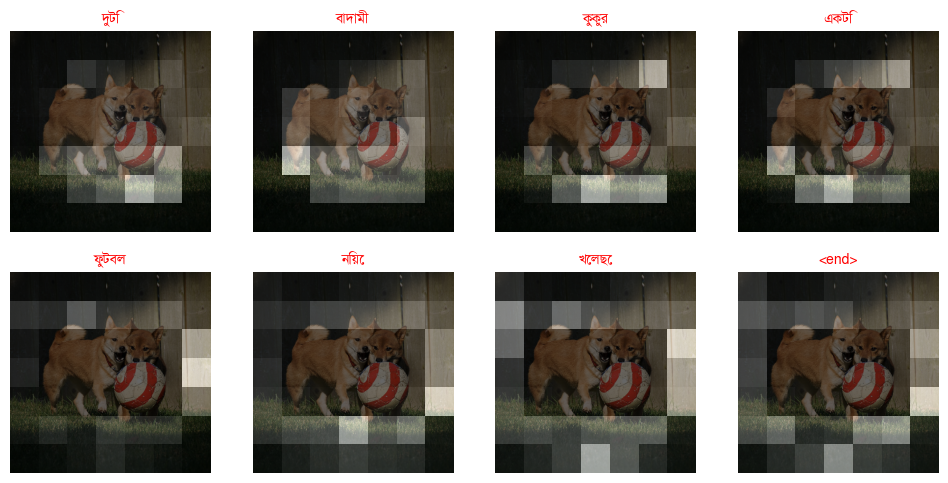

In [ ]:
cap_test_data = test_caption.copy()
rid = np.random.randint(0, len(test_data))
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['মাথায় কাপড় দেওয়া মধ্যপ্রাচ্যের একজন মহিলা নীল কাপড় পরা একটি বাচ্চার পাশে বসে আছে', 'একজন মহিলা এবং একটি ছেলে দুজনেই নীল রঙের ঐতিহ্যবাহী আরব পোশাক পরেছেন', 'এক মহিলা আর ছোট ছেলে দেয়ালের পাশে নীল জামা পরে হাটু গেড়ে বসে আছে', 'এক বাচ্চা ও এক মহিলা পাশা পাশি বসে আছেন', 'মাথায় স্কার্ফ পরা এক মহিলা নীল রঙের পোশাক পরিহিত একটি তরুণ ছেলের পাশে বসে আছেন']
Prediction Caption: এক বাচ্চা ও বাদামি রঙের দেয়ালে এক মহিলা পাশা পাশি বসে আছেন
BLEU-1: 83.333333
BLEU-2: 72.821908
BLEU-3: 62.764180
BLEU-4: 54.524691
Meteor Score: 0.962432


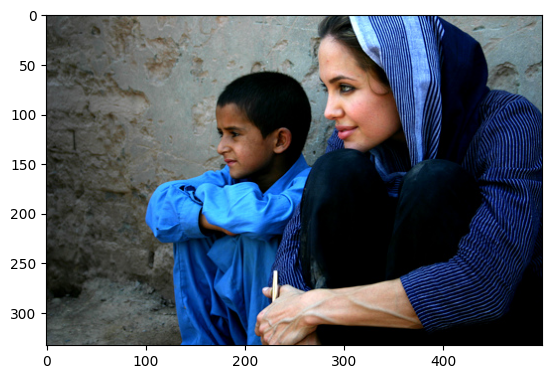

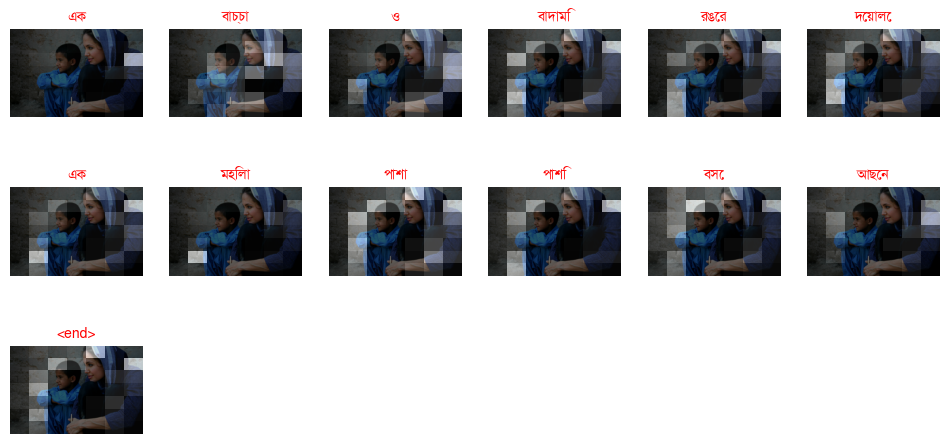

In [ ]:
cap_test_data = test_caption.copy()
rid = np.random.randint(0, len(test_data))
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি কালো কুকুর ক্যামেরার দিকে দৌড়াচ্ছে', 'একটি কালো কুকুর ঘাসের উপর দোড়াচ্ছে', 'একটি কালো কুকুর একটি বাদামী এবং সাদা কুকুরের কাছাকাছি ঘাসের উপর ছুটে চলেছে', 'শুকনো ঘাসের মধ্যে দিয়ে একটি কালো কুকুর দৌড়ে যায়', 'একটি কুকুর ক্যামেরার দিকে এগিয়ে আসছে আর একটি পিছনে হেঁটে যাচ্ছে']
Prediction Caption: একটি কুকুর ক্যামেরার দিকে এগিয়ে যাচ্ছে
BLEU-1: 100.000000
BLEU-2: 89.442719
BLEU-3: 83.520361
BLEU-4: 79.527073
Meteor Score: 0.625000


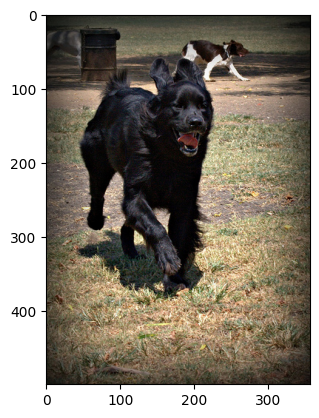

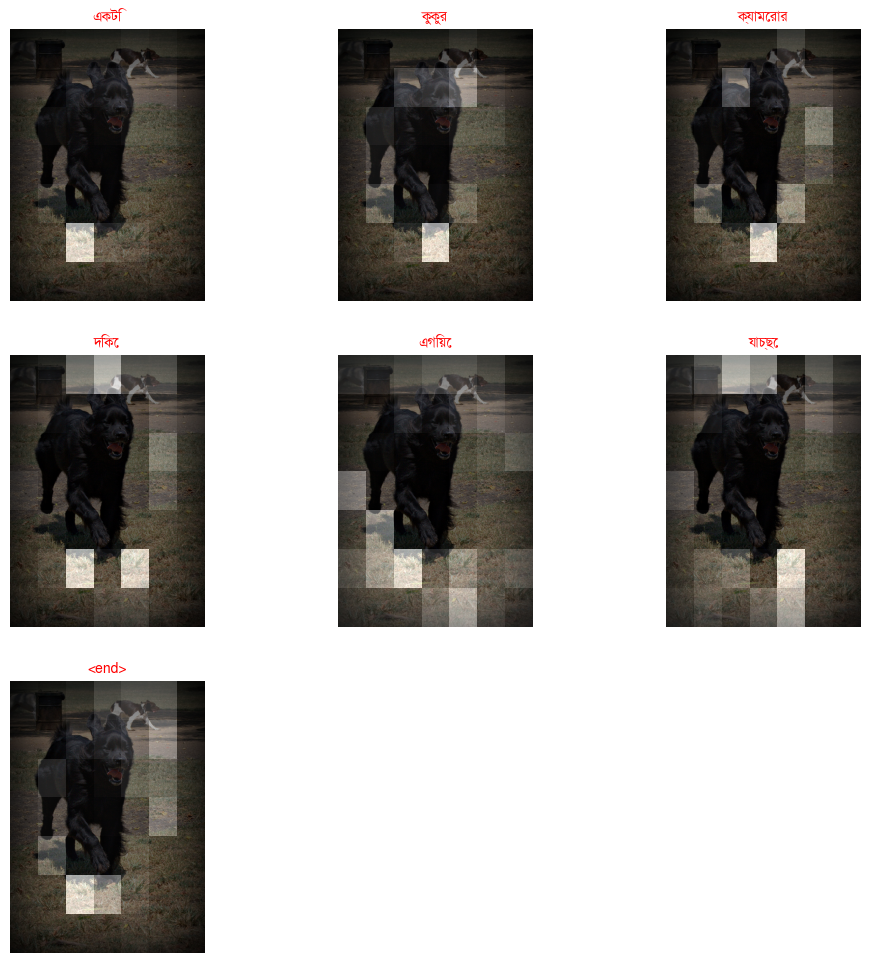

In [ ]:
cap_test_data = test_caption.copy()
rid = 100
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি ব্রিন্ডল লেপযুক্ত কুকুর একটি পার্কের ঘেরের অভ্যন্তরে বেগুনি রঙের কলারযুক্ত একটি জাম্পিং ব্রাউন কুকুরের দিকে ঘেউ ঘেউ করছে', 'দুটি কুকুর খেলছে একজন লোক তা দেখছে', 'খেলা করা দুটি কুকুরের সাথে একজন লোক দাঁড়িয়ে আছেন', 'একটি লোক একটি খেঁকী বাদামী ও কালো কুকুর এবং একটি দাঁড়ানো হালকা বাদামী কুকুরের পাশে দাঁড়িয়ে আছে', 'দুটি কুকুর একটি বাদামী এবং একটি ধুসর বর্ণের জিন্স পরা এক ব্যাক্তির পায়ের পাশে খেলছে']
Prediction Caption: একটি কুকুর একটি পার্কের ঘেরের অভ্যন্তরে বেগুনি রঙের কলারযুক্ত একটি বৃদ্ধ লোক একটি পার্কের ঘেরের অভ্যন্তরে বেগুনি রঙের কলারযুক্ত একটি বৃদ্ধ লোক একটি পার্কের ঘেরের অভ্যন্তরে বেগুনি রঙের কলারযুক্ত একটি বৃদ্ধ লোক একটি পার্কের ঘেরের অভ্যন্তরে বেগুনি রঙের কলারযুক্ত একটি বৃদ্ধ লোক একটি পার্কের ঘেরের অভ্যন্তরে বেগুনি রঙের কলারযুক্ত একটি বৃদ্ধ লোক একটি পার্কের ঘেরের অভ্যন্তরে বেগুনি রঙের কলারযুক্ত একটি বৃদ্ধ লোক একটি পার্কের ঘেরের অভ্যন্তরে বেগুনি রঙের কলারযুক্ত একটি বৃদ্ধ লোক একটি পার্কের ঘেরের অভ্যন্তরে বেগুনি রঙের কলারযুক্ত একটি বৃদ্ধ লোক একটি পার্কের ঘেরের 

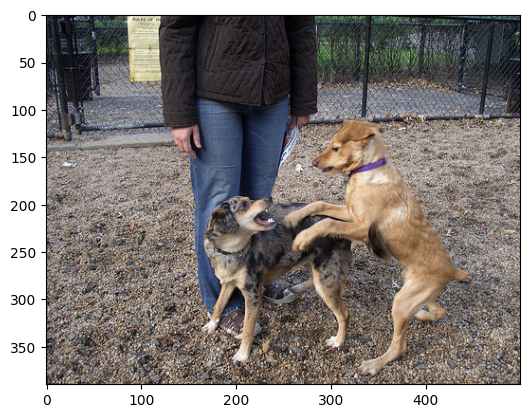

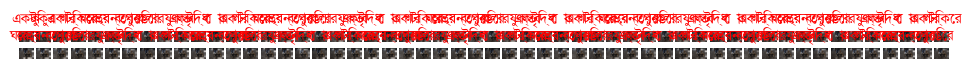

In [ ]:
cap_test_data = test_caption.copy()
rid = 1205
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি হকি খেলা হচ্ছে', 'দুজন মানুষ খেলার পোশাকে মাঠে দৌড়াচ্ছে', 'বেগুনি সাদা এবং কালো রঙের একটি খেলোয়াড় মাঠের শেষের কাছে একটি নাটক তৈরি করার চেষ্টা করে', 'পনেরো নম্বর জার্সি পরিহিত একজন খেলোয়াড় ল্যাক্রোস বল নিয়ে দৌড়াচ্ছে', 'দুজন লাক্রোসে খেলোয়াড় খেলার মাঠে দৌড়াচ্ছে']
Prediction Caption: বেগুনি সাদা কালো রঙের খেলা খেলা সময় একটি মাঠে বল ছুঁড়ে মারলো
BLEU-1: 66.666667
BLEU-2: 34.815531
BLEU-3: 12.700913
BLEU-4: 8.030146
Meteor Score: 0.285897


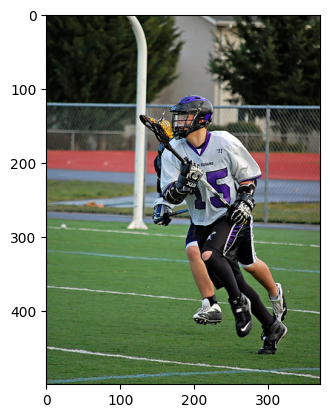

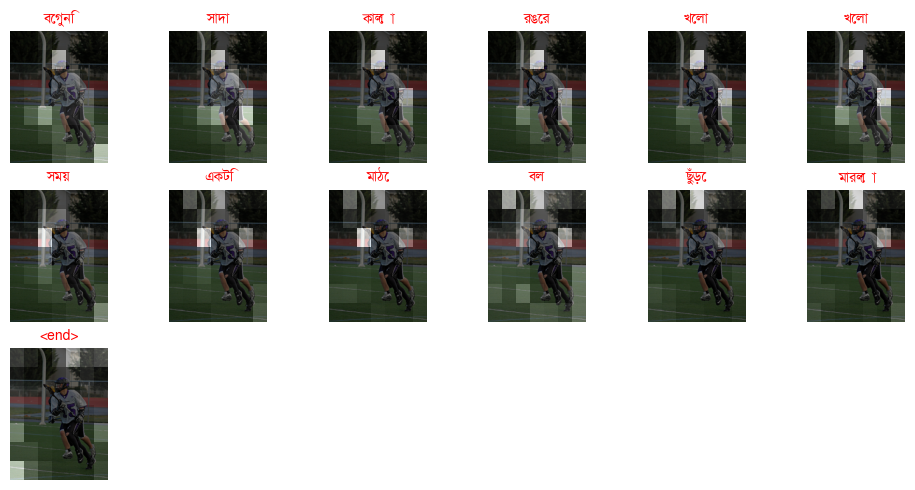

In [ ]:
cap_test_data = test_caption.copy()
rid = 2408
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['কাউবয় টুপি পরা মেয়েটি একটি ভেড়া নিয়ে দাঁড়িয়ে আছে', 'একটি গোলাপী টুপি পরা একটি মেয়ে ধূলিকণা পথে ভেড়ার পাশে হাঁটছে', 'গোলাপি টুপি পরে মেয়েটি একটি ভেড়া নিয়ে হাঁটছে', 'গোলাপি রাখাল টুপি পড়া এক ছোট মেয়ে একটি ফিতায় বাধা ভেড়া ধরে আছে', 'মেয়েটি পিংক রংয়ের রাখালী টুপি এবং পিংক বুট পরেছে']
Prediction Caption: গোলাপি রঙের পোশাক পরা মেয়েটি একটি ভেড়া নিয়ে দাঁড়িয়ে আছে
BLEU-1: 80.000000
BLEU-2: 73.029674
BLEU-3: 68.294415
BLEU-4: 66.063286
Meteor Score: 0.768109


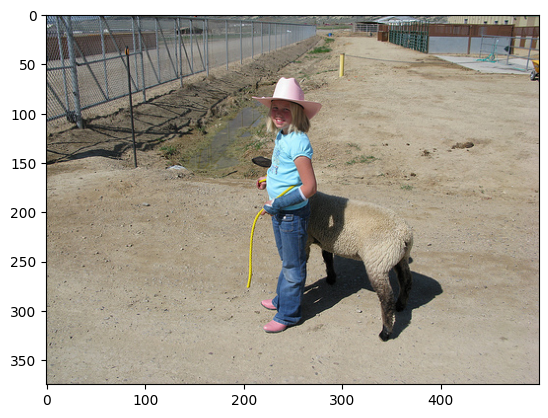

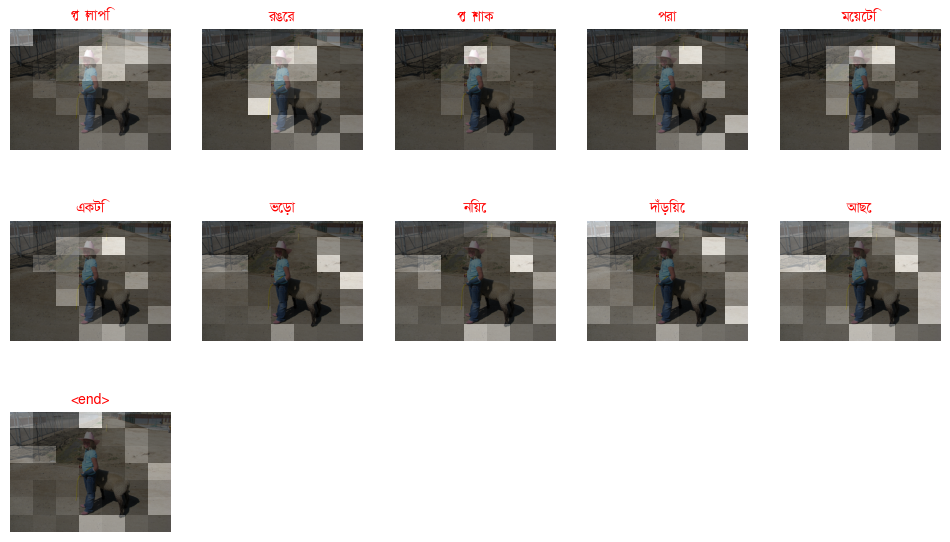

In [ ]:
cap_test_data = test_caption.copy()
rid = 161
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['বৃদ্ধ লোকটি থাম্বস আপ দিচ্ছেন', 'ধূসর দাড়ি এবং ডেনিম টুপিযুক্ত একটি মানুষ হাত দিয়ে থাম্বস আপ সাইন দেয়', 'একটি সাদা কেশিক দাড়ি এবং একটি নীল ক্যাপযুক্ত একটি বৃদ্ধ ব্যক্তি তার ডান হাত দিয়ে থাম্বস আপ সাইন দেয়', 'সাদা দাড়ি ওয়ালা লোকটি বৃদ্ধাঙ্গুলি দেখাচ্ছে', 'সাদা ক্যাপ পড়া বয়স্ক ব্যক্তি থাম্বস আপ দেখাচ্ছে']
Prediction Caption: একজন বৃদ্ধ লোক নিচে তাকিয়ে আছে
BLEU-1: 16.666667
BLEU-2: 7.728216
BLEU-3: 4.525874
BLEU-4: 3.759340
Meteor Score: 0.098039


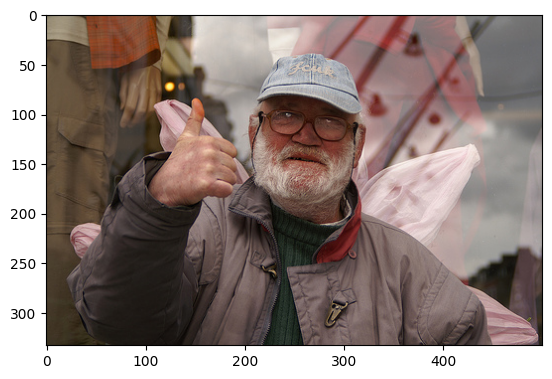

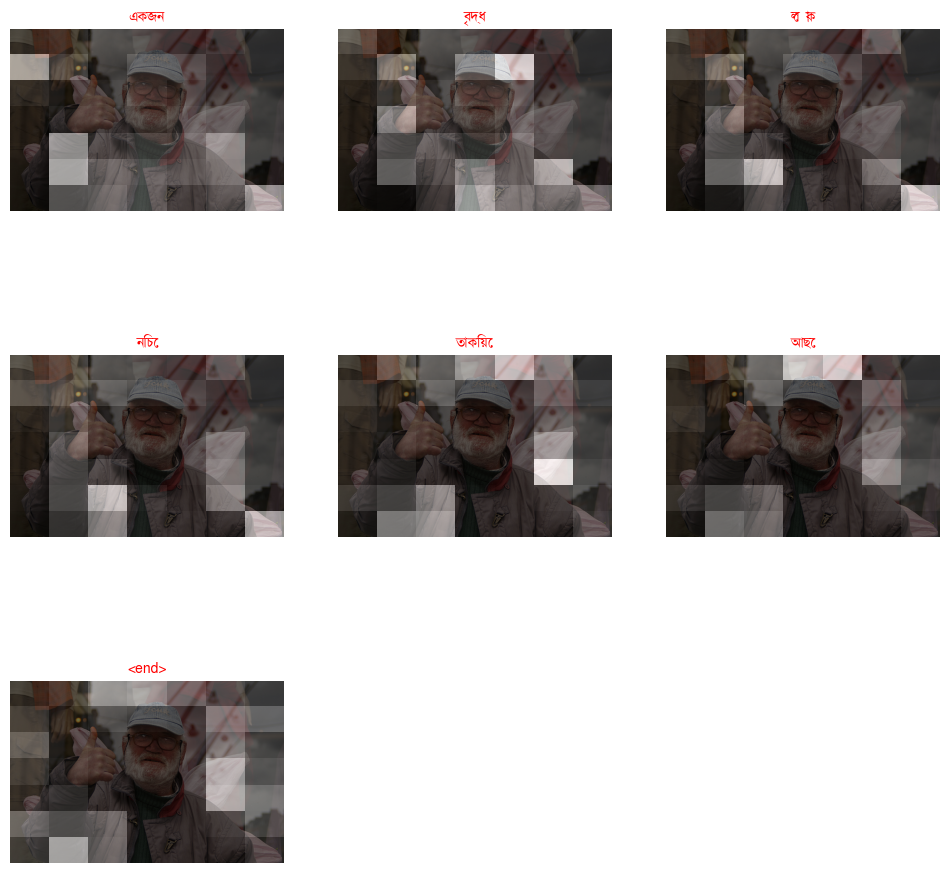

In [ ]:
cap_test_data = test_caption.copy()
rid = 235
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি কালো সাদা কুকুর একটি কাঠের তক্তার উপর ভারসাম্য রাখছে', 'কুকুরটি একটি কাঠ দন্ডের উপর হাঁটছে', 'একটি কুকুর প্লাটফর্মের উপরে এক্রোবেটিক কৌশল প্রদর্শন করছে', 'নীল রেলিং এর পাশে লাল কাঠের তক্তার উপর একটি কুকুর হাঁটছে', 'একটি উঁচু তক্তার উপর কুকুরটি হাঁটছে']
Prediction Caption: একটি কুকুর প্লাটফর্মের উপরে এক্রোবেটিক কৌশল করার সময় এক্রোবেটিক কৌশল করার সময় একটি লাল রেলিং বেয়ে এক্রোবেটিক কৌশল করার সময় এক্রোবেটিক কৌশল করার সময় একটি লাল রেলিং বেয়ে এক্রোবেটিক কৌশল করার সময় এক্রোবেটিক কৌশল করার সময় একটি লাল রেলিং বেয়ে এক্রোবেটিক কৌশল করার সময় এক্রোবেটিক কৌশল করার সময় একটি লাল রেলিং বেয়ে এক্রোবেটিক কৌশল করার সময় এক্রোবেটিক কৌশল করার সময় একটি লাল রেলিং বেয়ে এক্রোবেটিক কৌশল করার সময় এক্রোবেটিক কৌশল করার সময় একটি লাল রেলিং বেয়ে এক্রোবেটিক কৌশল করার সময় এক্রোবেটিক কৌশল করার সময় একটি লাল রেলিং বেয়ে এক্রোবেটিক কৌশল করার সময় এক্রোবেটিক কৌশল করার সময় একটি লাল রেলিং বেয়ে এক্রোবেটিক কৌশল করার সময় এক্রোবেটিক কৌশল করার
BLEU-1: 8.411215
BLEU-2: 6.298852
BLEU-3: 4.813

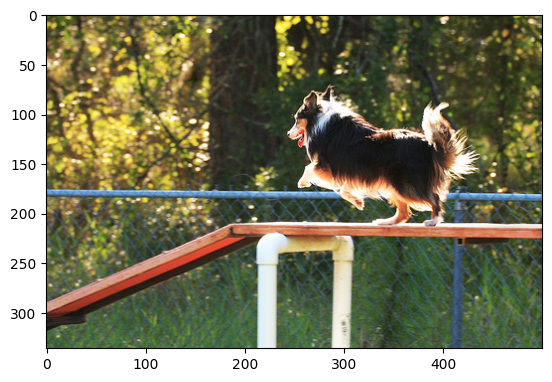

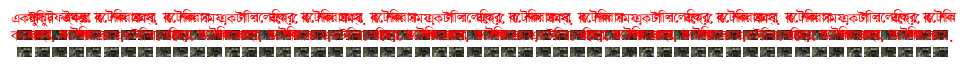

In [ ]:
cap_test_data = test_caption.copy()
rid = 2935
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

In [ ]:
b1=[]
b2=[]
b3=[]
b4=[]
m_score = []

for rid in range(0,len(test_data)):
  test_image= test_data[rid]
  real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
  result, attention_plot, pred_test = evaluate(test_image)
  pred_caption=' '.join(result).rsplit(' ', 1)[0]
  reference = real_caption
  candidate = pred_caption.split()
  print(pred_caption)
  smooth = SmoothingFunction().method4
  bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
  bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
  bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
  bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
  b1.append(bleu1)
  b2.append(bleu2)
  b3.append(bleu3)
  b4.append(bleu4)
  score = meteor_score(reference,candidate)
  m_score.append(score)

রাতের বেলা বরফে এক লোক স্কেটিং করছে
একটি ছোট মেয়ে একটি গোলাপি বলের পিছনে ছুটছে
একটি বাদামী কুকুর একটি গাছের পাশে দাঁড়িয়ে আছে
একজন লোক সাইকেল চালাচ্ছে
খেলনা নিয়ে ঘাসের উপর এবং কুকুর খেলনা নিয়ে খেলছে
একটি অন্ধকার চূড়া থেকে বরফে খণ্ডের দেখছে
দুটি কুকুর পানিতে থাকা অন্য কুকুরটিকে তাড়া করছে এবং একটির মুখে গাছের ডাল নিয়ে উঠে আসলো
সাদা ও সাদা রেস মোঠরসাইকেল মধ্যে একজন বিজ্ঞাপনের চিহ্নের আলোতে ঘুরছেন এবং বাজে অংশ
একটি কুকুর পানিতে ঝাপ দিচ্ছে
একটি শহরের মাঝখানে দুজন লোকসহ একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি ছোট নৌকার মধ্যে একটি

In [ ]:
print('BLEU-1: %f' % np.mean(b1))
print('BLEU-2: %f' % np.mean(b2))
print('BLEU-3: %f' % np.mean(b3))
print('BLEU-4: %f' % np.mean(b4))

BLEU-1: 69.628875
BLEU-2: 60.368050
BLEU-3: 51.694920
BLEU-4: 46.537397


In [ ]:
print('Meteor Score of Bahdanau attention: %f' % np.mean(m_score))

Meteor Score of Bahdanau attention: 0.577927
